### Download Data Set

In [3]:
from dataset1 import download_cifar10_dataset
dataset = download_cifar10_dataset()

Dataset Downloading ...
Downloaded CIFAR-10 dataset to  c:\Users\Jeremiah\Desktop\Research Project Dasgupta\Workspace\datasets


### Load Data Set

In [4]:
from dataset1 import load_dataset_splits
x_train, y_train, x_test, y_test = load_dataset_splits()

======> CIFAR-10 dataset loaded
Training set data shape:  (50000, 3, 32, 32)
Training set label shape:  (50000,)
Test set data shape:  (10000, 3, 32, 32)
Test set label shape:  (10000,)


numpy.ndarray

### Visualize Data

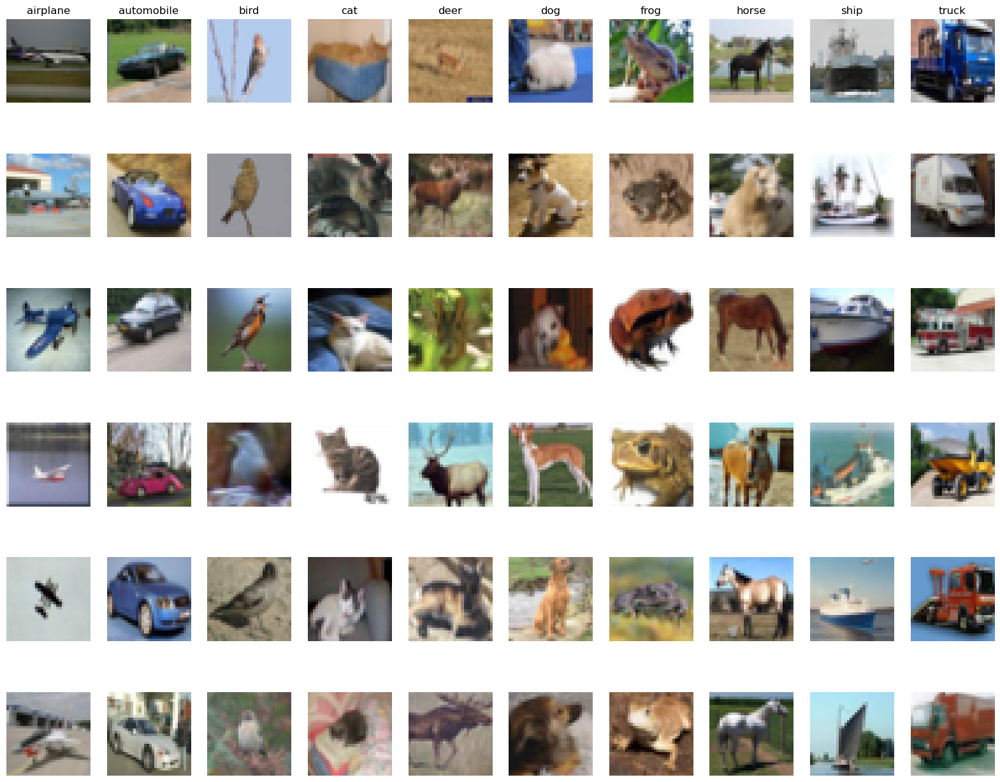

In [3]:
from dataset1 import visualize_cifar_data
visualize_cifar_data(images=x_train.transpose(0, 2, 3, 1), labels=y_train, samples_per_class=6)

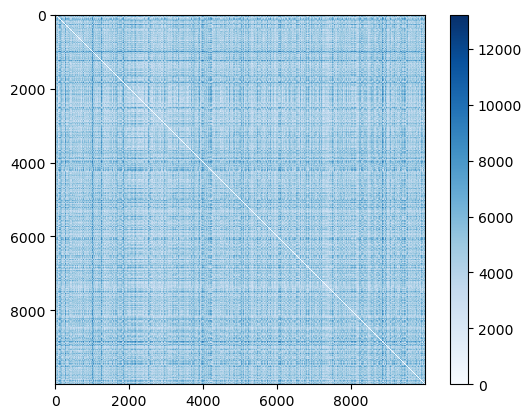

In [12]:
from sklearn.metrics import pairwise_distances
D = pairwise_distances(x_test.reshape(x_test.shape[0], -1))
D.shape

%matplotlib inline
import matplotlib.pyplot as plt
plt.imshow(D, zorder=2, cmap='Blues', interpolation='nearest')
plt.colorbar()

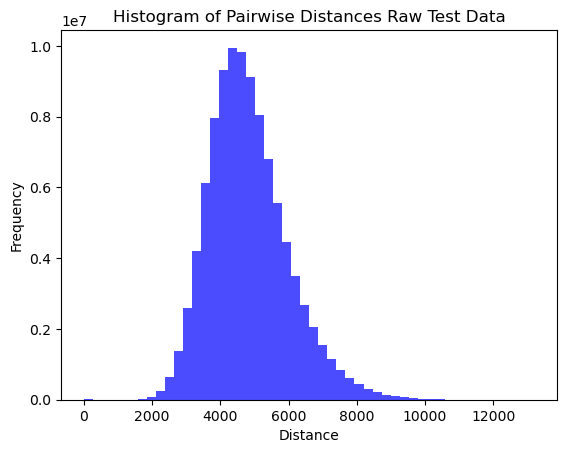

In [13]:
distances = D.flatten()

# Step 3: Plot the histogram
plt.hist(distances, bins=50, color='blue', alpha=0.7)
plt.title('Histogram of Pairwise Distances Raw Test Data')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.show()

### Code for NN Function

In [6]:
from sklearn.neighbors import KNeighborsClassifier

def run_nearest_neighbor(x_train, y_train, x_test, y_test):
    # create classifier
    nn_classifier = KNeighborsClassifier(n_neighbors=1, algorithm='auto')
    
    # train 
    nn_classifier.fit(x_train, y_train)

    # test and report accuracy
    test_acc = nn_classifier.score(x_test, y_test)
    print("Nearest neighbor accuracy on the test set: %f"%test_acc)
    
    return nn_classifier

### NN on Raw Pixel

In [5]:
from extract_feature import compute_or_load_features

# compute or load features
raw_pixel_train_features, raw_pixel_test_features = compute_or_load_features(x_train, x_test, "raw_pixel")

# run knn
raw_pixel_knn_classifier = run_nearest_neighbor(raw_pixel_train_features, y_train, raw_pixel_test_features, y_test)

======> Loaded train and test features from  c:\Users\Jeremiah\Desktop\Research Project Dasgupta\Workspace\features\raw_pixel.pkl
Training feature shape:  (50000, 3072)
Test feature shape:  (10000, 3072)
Nearest neighbor accuracy on the test set: 0.353900


### NN on HOG

In [6]:
from extract_feature import compute_or_load_features

# compute or load features
hog_train_features, hog_test_features = compute_or_load_features(x_train, x_test, "hog")
    
# run knn
hog_knn_classifier = run_nearest_neighbor(hog_train_features, y_train, hog_test_features, y_test)

======> Loaded train and test features from  c:\Users\Jeremiah\Desktop\Research Project Dasgupta\Workspace\features\hog.pkl
Training feature shape:  (50000, 512)
Test feature shape:  (10000, 512)
Nearest neighbor accuracy on the test set: 0.365700


### NN on VGG 11

#### Summary (VGG 11)

In [4]:
from torchinfo import summary
from vgg_network import vgg11_bn

vgg_model = vgg11_bn(pretrained=False)
summary(vgg_model, input_size=(16, 3, 32, 32))

Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [16, 10]                  --
├─Sequential: 1-1                        [16, 512, 1, 1]           --
│    └─Conv2d: 2-1                       [16, 64, 32, 32]          1,792
│    └─BatchNorm2d: 2-2                  [16, 64, 32, 32]          128
│    └─ReLU: 2-3                         [16, 64, 32, 32]          --
│    └─MaxPool2d: 2-4                    [16, 64, 16, 16]          --
│    └─Conv2d: 2-5                       [16, 128, 16, 16]         73,856
│    └─BatchNorm2d: 2-6                  [16, 128, 16, 16]         256
│    └─ReLU: 2-7                         [16, 128, 16, 16]         --
│    └─MaxPool2d: 2-8                    [16, 128, 8, 8]           --
│    └─Conv2d: 2-9                       [16, 256, 8, 8]           295,168
│    └─BatchNorm2d: 2-10                 [16, 256, 8, 8]           512
│    └─ReLU: 2-11                        [16, 256, 8, 8]           --


#### NN on pretrained CNN features (VGG 11)

Last Conv:

In [7]:
from extract_feature import compute_or_load_features

# compute or load features
pretrained_cnn_last_conv_train_features, pretrained_cnn_last_conv_test_features = compute_or_load_features(x_train, x_test, "pretrained_vgg", "last_conv")

# run knn
pretrained_cnn_last_conv_knn_classifier = run_nearest_neighbor(pretrained_cnn_last_conv_train_features, y_train, pretrained_cnn_last_conv_test_features, y_test)

======> Loaded train and test features from  c:\Users\Jeremiah\Desktop\Research Project Dasgupta\Workspace\features\pretrained_vgg_last_conv.pkl
Training feature shape:  (50000, 512)
Test feature shape:  (10000, 512)
Nearest neighbor accuracy on the test set: 0.919900


Interpoint distances in training data

In [8]:
from sklearn.metrics import pairwise_distances
D = pairwise_distances(pretrained_cnn_last_conv_train_features)
D.shape

(50000, 50000)

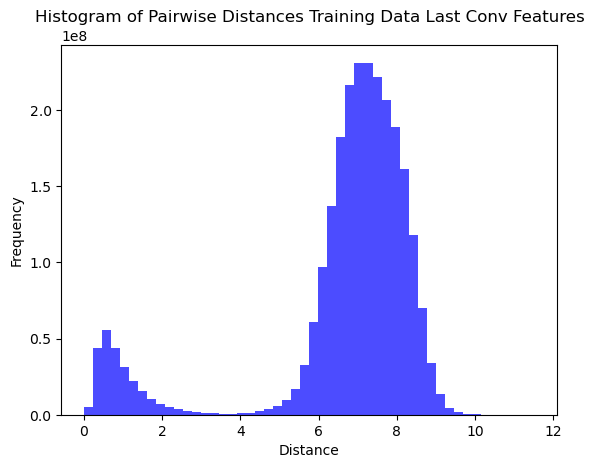

In [11]:
distances = D.flatten()

# Step 3: Plot the histogram
plt.hist(distances, bins=50, color='blue', alpha=0.7)
plt.title('Histogram of Pairwise Distances Training Data Last Conv Features')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.show()

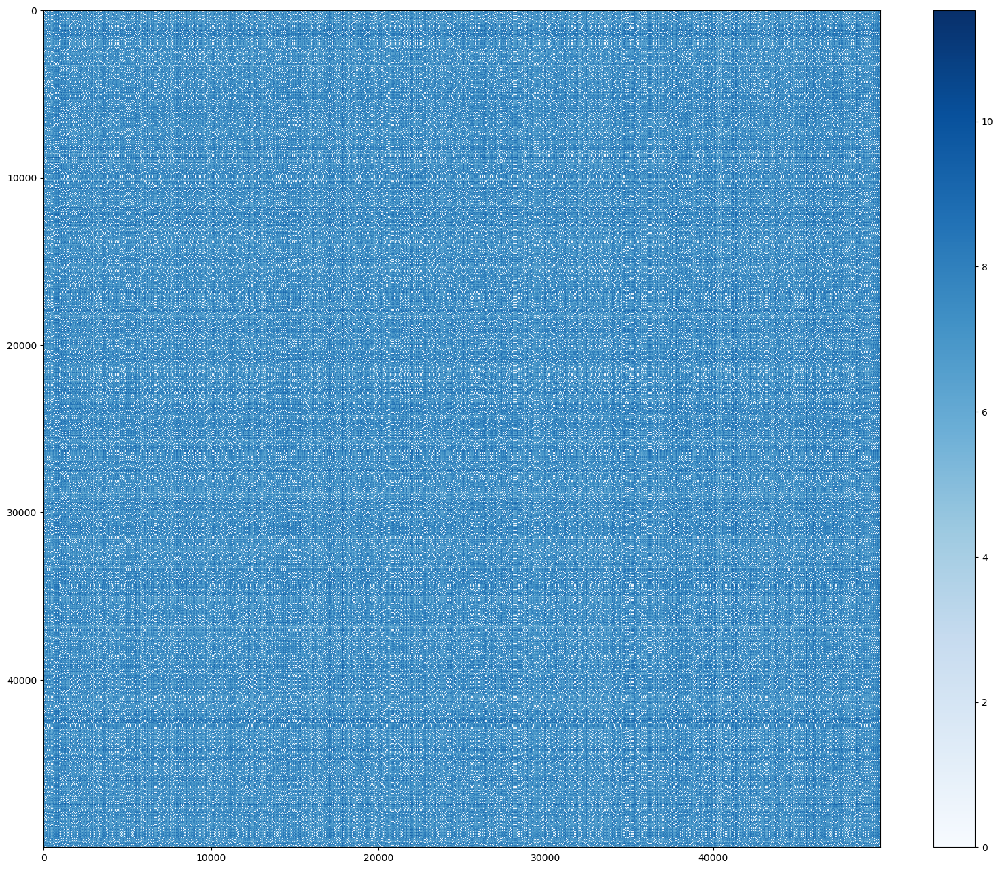

In [16]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.imshow(D, zorder=2, cmap='Blues', interpolation='nearest')
plt.colorbar()

Interpoint distances in test data

In [14]:
from sklearn.metrics import pairwise_distances
D2 = pairwise_distances(pretrained_cnn_last_conv_test_features)
D2.shape

(10000, 10000)

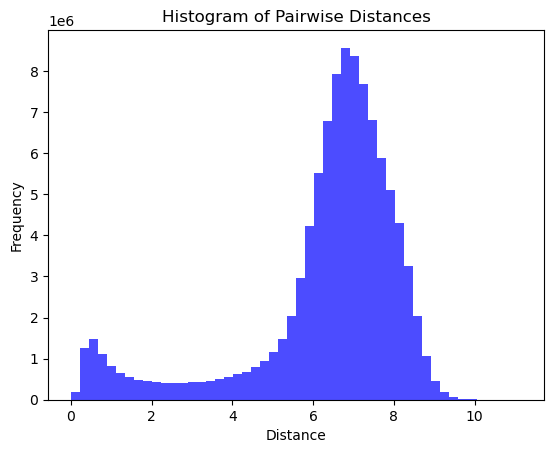

In [15]:
distances = D2.flatten()

# Step 3: Plot the histogram
plt.hist(distances, bins=50, color='blue', alpha=0.7)
plt.title('Histogram of Pairwise Distances')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.show()

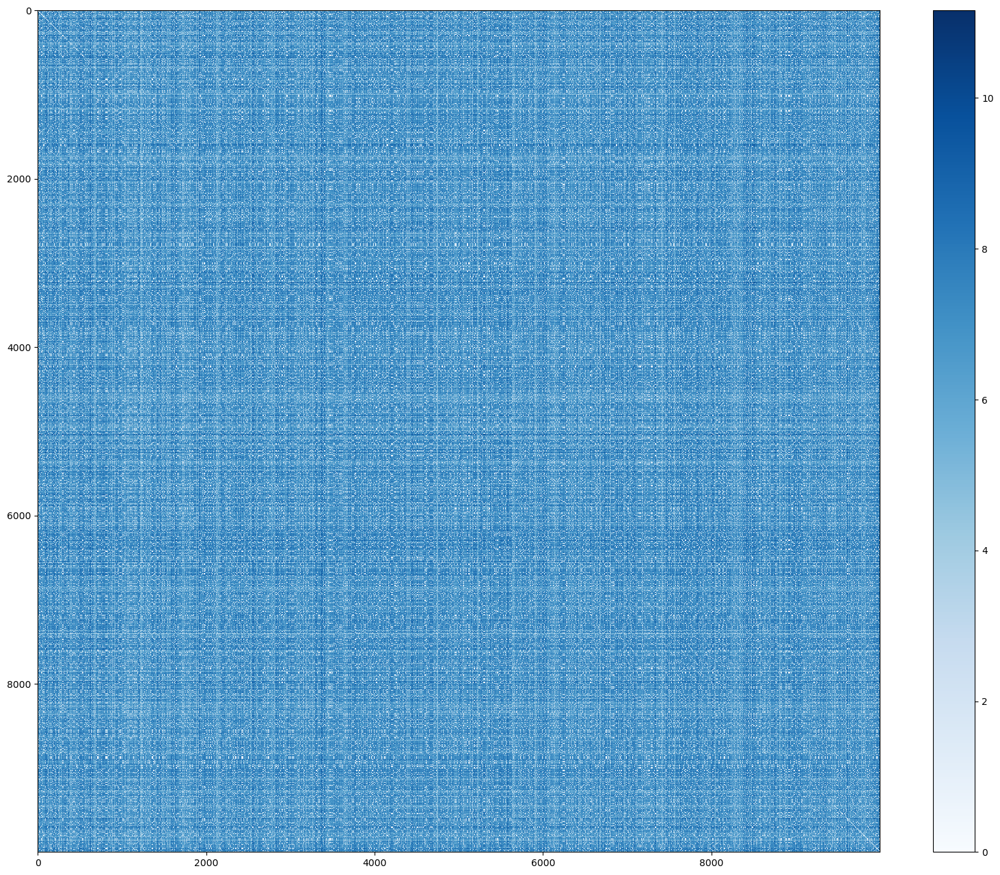

In [20]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.imshow(D2, zorder=2, cmap='Blues', interpolation='nearest')
plt.colorbar()

Last FC:

In [16]:
from extract_feature import compute_or_load_features

# compute or load features
pretrained_cnn_last_fc_train_features, pretrained_cnn_last_fc_test_features = compute_or_load_features(x_train, x_test, "pretrained_vgg", "last_fc")

# run knn
pretrained_cnn_last_fc_knn_classifier = run_nearest_neighbor(pretrained_cnn_last_fc_train_features, y_train, pretrained_cnn_last_fc_test_features, y_test)

======> Loaded train and test features from  c:\Users\Jeremiah\Desktop\Research Project Dasgupta\Workspace\features\pretrained_vgg_last_fc.pkl
Training feature shape:  (50000, 4096)
Test feature shape:  (10000, 4096)
Nearest neighbor accuracy on the test set: 0.920800


Interpoint distances of test features

In [17]:
from sklearn.metrics import pairwise_distances
D3 = pairwise_distances(pretrained_cnn_last_fc_test_features)
D3.shape

(10000, 10000)

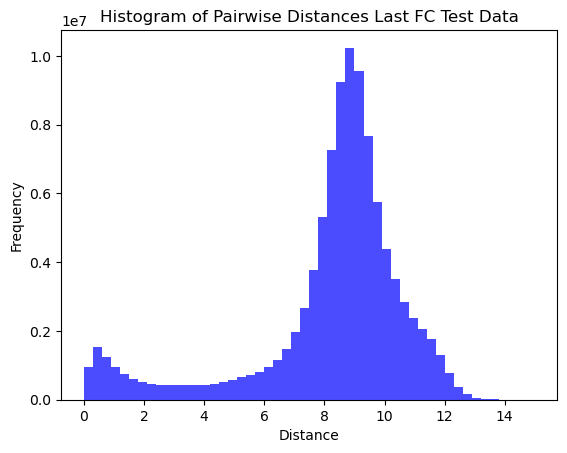

In [18]:
distances = D3.flatten()

# Step 3: Plot the histogram
plt.hist(distances, bins=50, color='blue', alpha=0.7)
plt.title('Histogram of Pairwise Distances Last FC Test Data')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.show()

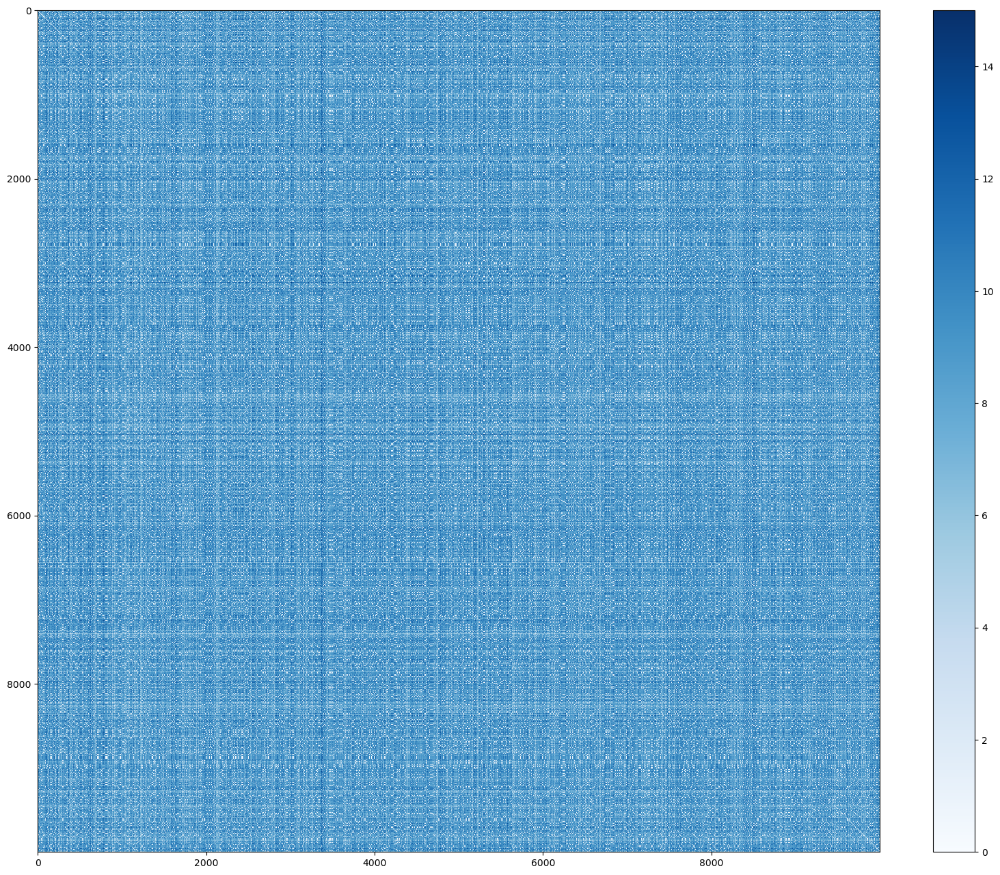

In [24]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.imshow(D3, zorder=2, cmap='Blues', interpolation='nearest')
plt.colorbar()

Alignment between NN classifier and CNN model

In [3]:
from vgg_network import test_pretrained_vgg

test_acc = test_pretrained_vgg(x_test, y_test)
print('Accuracy on the test images: ', test_acc) 

Accuracy on the test images:  0.9226


### K-means on different layers

c:\Users\Jeremiah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)
c:\Users\Jeremiah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1962: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
c:\Users\Jeremiah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)
c:\Users\Jeremiah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1962: UserWarning: MiniBatchKMeans is kno

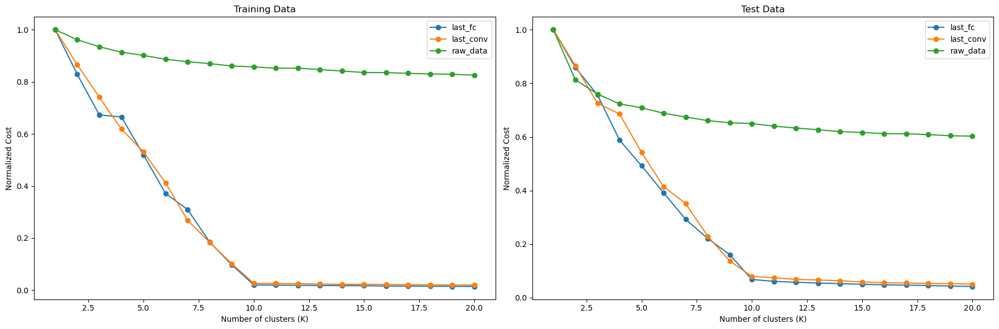

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import MinMaxScaler

# Function to compute K-means for a given feature set (train or test)
def compute_kmeans(features):
    costs = []
    for k in range(1, 21):
        kmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
        kmeans.fit(features)
        costs.append(kmeans.inertia_)
    # Normalize costs by dividing by the cost when k=1
    costs_normalized = np.array(costs) / costs[0]
    return costs_normalized

# Compute K-means costs for last_fc features
last_fc_train_costs = compute_kmeans(pretrained_cnn_last_fc_train_features)
last_fc_test_costs = compute_kmeans(pretrained_cnn_last_fc_test_features)

# Compute K-means costs for last_conv features
last_conv_train_costs = compute_kmeans(pretrained_cnn_last_conv_train_features)
last_conv_test_costs = compute_kmeans(pretrained_cnn_last_conv_test_features)

# Compute K-means costs for raw data
x_train_costs = compute_kmeans(x_train.reshape(x_test.shape[0], -1))
x_test_costs = compute_kmeans(x_test.reshape(x_test.shape[0], -1))

# Plotting
plt.figure(figsize=(18, 6))

# Plot for training data
plt.subplot(1, 2, 1)
plt.plot(range(1, 21), last_fc_train_costs, marker='o', label='last_fc')
plt.plot(range(1, 21), last_conv_train_costs, marker='o', label='last_conv')
plt.plot(range(1, 21), x_train_costs, marker='o', label='raw_data')
plt.title('Training Data')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Normalized Cost')
plt.legend()

# Plot for test data
plt.subplot(1, 2, 2)
plt.plot(range(1, 21), last_fc_test_costs, marker='o', label='last_fc')
plt.plot(range(1, 21), last_conv_test_costs, marker='o', label='last_conv')
plt.plot(range(1, 21), x_test_costs, marker='o', label='raw_data')
plt.title('Test Data')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Normalized Cost')
plt.legend()

plt.tight_layout()
plt.show()


c:\Users\Jeremiah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)
c:\Users\Jeremiah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1962: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
c:\Users\Jeremiah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)
c:\Users\Jeremiah\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1962: UserWarning: MiniBatchKMeans is kno

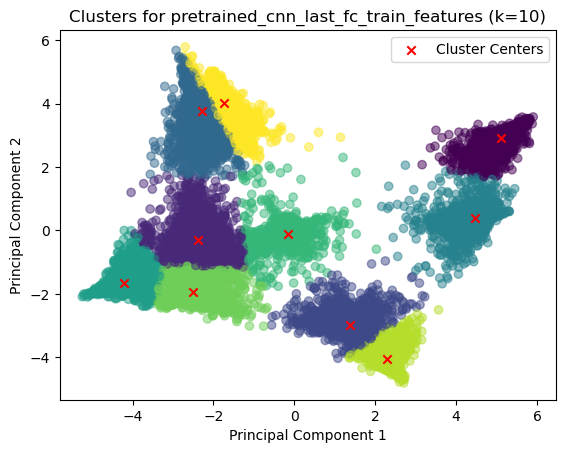

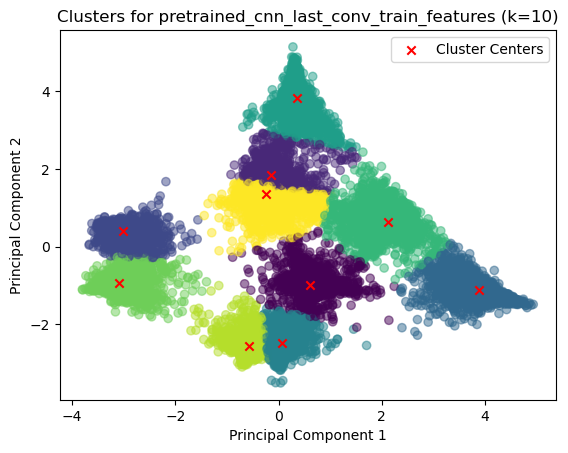

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

# Function to compute K-means for a given feature set (train or test)
def compute_kmeans(features, n_clusters=10):
    kmeans = MiniBatchKMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(features)
    return kmeans.labels_, kmeans.cluster_centers_

# Function to visualize clusters
def plot_clusters(features, labels, centers, title):
    plt.scatter(features[:, 0], features[:, 1], c=labels, cmap='viridis', alpha=0.5)
    plt.scatter(centers[:, 0], centers[:, 1], marker='x', c='red', label='Cluster Centers')
    plt.title(title)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend()
    plt.show()

# Assuming pretrained_cnn_last_fc_train_features and pretrained_cnn_last_conv_train_features are defined

# Perform PCA for pretrained_cnn_last_fc_train_features
pca_fc = PCA(n_components=2)
pca_fc.fit(pretrained_cnn_last_fc_train_features)
last_fc_train_pca = pca_fc.transform(pretrained_cnn_last_fc_train_features)

# Perform PCA for pretrained_cnn_last_conv_train_features
pca_conv = PCA(n_components=2)
pca_conv.fit(pretrained_cnn_last_conv_train_features)
last_conv_train_pca = pca_conv.transform(pretrained_cnn_last_conv_train_features)

# Compute K-means for pretrained_cnn_last_fc_train_features
last_fc_train_labels, last_fc_train_centers = compute_kmeans(last_fc_train_pca)

# Compute K-means for pretrained_cnn_last_conv_train_features
last_conv_train_labels, last_conv_train_centers = compute_kmeans(last_conv_train_pca)

# Plot clusters for pretrained_cnn_last_fc_train_features
plot_clusters(last_fc_train_pca, last_fc_train_labels, last_fc_train_centers, 'Clusters for pretrained_cnn_last_fc_train_features (k=10)')

# Plot clusters for pretrained_cnn_last_conv_train_features
plot_clusters(last_conv_train_pca, last_conv_train_labels, last_conv_train_centers, 'Clusters for pretrained_cnn_last_conv_train_features (k=10)')


In [34]:
def get_average_label(labels, cluster_labels):
    average_labels = []
    for cluster_label in np.unique(cluster_labels):
        indices = np.where(cluster_labels == cluster_label)
        cluster_labels_subset = labels[indices]
        average_label = np.mean(cluster_labels_subset)
        average_labels.append(average_label)
    return average_labels

last_fc_average_labels = get_average_label(last_fc_train_labels, last_fc_train_labels)
last_conv_average_labels = get_average_label(last_conv_train_labels, last_conv_train_labels)

print("Average labels for last_fc clusters:", last_fc_average_labels)
print("Average labels for last_conv clusters:", last_conv_average_labels)

Average labels for last_fc clusters: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0]
Average labels for last_conv clusters: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0]


#### MNIST

In [11]:
import torch
from torchvision import datasets, transforms

def load_mnist_dataset_pytorch(expand_size=(32, 32)):
    # Define transformations for the dataset, including padding and color conversion
    transform = transforms.Compose([
        transforms.Pad((2, 2), fill=0),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.repeat(3, 1, 1)),  # Convert to RGB
        transforms.Normalize((0.1307,), (0.3081,))
    ])

    # Load the MNIST training and test datasets
    train_dataset = datasets.MNIST('./data', train=True, download=True, transform=transform)
    test_dataset = datasets.MNIST('./data', train=False, download=True, transform=transform)

    # Extract the data and labels from the datasets
    x_train, y_train = train_dataset.data.numpy(), train_dataset.targets.numpy()
    x_test, y_test = test_dataset.data.numpy(), test_dataset.targets.numpy()

    return x_train, y_train, x_test, y_test

# Load MNIST dataset using PyTorch and expand it to 32x32 and convert to RGB
x_train, y_train, x_test, y_test = load_mnist_dataset_pytorch()

# Print shapes of the loaded datasets
print('x_train shape:', x_train.shape)
print('y_train shape:', y_train.shape)
print('x_test shape:', x_test.shape)
print('y_test shape:', y_test.shape)

100%|██████████| 9912422/9912422 [00:00<00:00, 45070524.81it/s]


Extracting ./data\MNIST\raw\train-images-idx3-ubyte.gz to ./data\MNIST\raw



100%|██████████| 28881/28881 [00:00<00:00, 28862447.90it/s]


Extracting ./data\MNIST\raw\train-labels-idx1-ubyte.gz to ./data\MNIST\raw



100%|██████████| 1648877/1648877 [00:00<00:00, 41221227.22it/s]

Extracting ./data\MNIST\raw\t10k-images-idx3-ubyte.gz to ./data\MNIST\raw



100%|██████████| 4542/4542 [00:00<?, ?it/s]

Extracting ./data\MNIST\raw\t10k-labels-idx1-ubyte.gz to ./data\MNIST\raw

x_train shape: (60000, 28, 28)
y_train shape: (60000,)
x_test shape: (10000, 28, 28)
y_test shape: (10000,)
